In [1]:
import numpy as np 
import pandas as pd 
from datetime import datetime as dt

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab

import plotly.express as px
import plotly.graph_objects as go


import itertools

import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.tsa.api as smt

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

import warnings
warnings.filterwarnings('ignore')
#pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None) 
pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.set_option('display.expand_frame_repr', False)

In [2]:
dataset = pd.read_csv('train.csv')
df = dataset.copy()

In [3]:
df

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales
0,1,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.00,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.96
1,2,CA-2017-152156,08/11/2017,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.00,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.94
2,3,CA-2017-138688,12/06/2017,16/06/2017,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036.00,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.62
3,4,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.00,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.58
4,5,US-2016-108966,11/10/2016,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.00,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.37
5,6,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032.00,West,FUR-FU-10001487,Furniture,Furnishings,Eldon Expressions Wood and Plastic Desk Access...,48.86
6,7,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032.00,West,OFF-AR-10002833,Office Supplies,Art,Newell 322,7.28
7,8,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032.00,West,TEC-PH-10002275,Technology,Phones,Mitel 5320 IP Phone VoIP phone,907.15
8,9,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032.00,West,OFF-BI-10003910,Office Supplies,Binders,DXL Angle-View Binders with Locking Rings by S...,18.50
9,10,CA-2015-115812,09/06/2015,14/06/2015,Standard Class,BH-11710,Brosina Hoffman,Consumer,United States,Los Angeles,California,90032.00,West,OFF-AP-10002892,Office Supplies,Appliances,Belkin F5C206VTEL 6 Outlet Surge,114.90


In [4]:
def check_df(dataset, head = 5):
    print("-"*10 + ' Shape Information of Dataset ' + "-"*10, end = '\n'*2)
    print(f" The dataset consist of {dataset.shape[0]} rows & {dataset.shape[1]} columns", end = '\n'*2)
    print("-"*10 + ' General informations about to Dataset ' + "-"*10, end = '\n'*2)
    print(dataset.info(), end = '\n'*2)
    print("-"*10 + " Are there any null values in the dataset? " + "-"*10, end = '\n'*2)
    print(dataset.isnull().sum(), end = '\n'*2)
    print("-"*10 + " Are there any dublicated values in the dataset? " + "-"*10, end = '\n'*2)
    print(dataset[dataset.duplicated()].shape[0], end = '\n'*2)
    print("-"*10 + " What is the Number of Unique Classes in the Variables ? " + ' ' + "-"*10, end = '\n'*2)
    print(dataset.nunique(), end = '\n'*2)
    print('-'*10 + ' Descriptive Statistics of Numerical Features ' + "-"*10, end = '\n'*2)
    print(dataset.describe().T, end = '\n'*2)
    print("-"*10 + 'Quantiles of Numerical Features' + "-"*10, end ='\n'*2)
    print(dataset.describe([0,0.25, 0.50,0.75,1.0]).T, end = '\n'*2)

check_df(df)

---------- Shape Information of Dataset ----------

 The dataset consist of 9800 rows & 18 columns

---------- General informations about to Dataset ----------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9800 entries, 0 to 9799
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Row ID         9800 non-null   int64  
 1   Order ID       9800 non-null   object 
 2   Order Date     9800 non-null   object 
 3   Ship Date      9800 non-null   object 
 4   Ship Mode      9800 non-null   object 
 5   Customer ID    9800 non-null   object 
 6   Customer Name  9800 non-null   object 
 7   Segment        9800 non-null   object 
 8   Country        9800 non-null   object 
 9   City           9800 non-null   object 
 10  State          9800 non-null   object 
 11  Postal Code    9789 non-null   float64
 12  Region         9800 non-null   object 
 13  Product ID     9800 non-null   object 
 14  Category       9800 non

In [5]:
df.drop(columns = ['Country','Customer ID'], inplace = True) 

df["Row ID"] = df["Row ID"].astype("str") 
df.loc[(df["Postal Code"].isnull()), "Postal Code"] = 5401 #When we look at the observations with an empty Postal Code value in the Data Set, only Vermont - Burlington's Postal Code value is blank. 
                                                            #I am writing this postal code value to blank observations with a Google search.

df["Postal Code"] = df["Postal Code"].astype("str") #I am not doing any arithmetic with the Postal Code variable. So I update the datatype of this variable to int->Str


def convert_datetime(dataframe):      #The data type of the variables containing Date in the dataset is seen as Object. I am changing these string expressions to datetime.
    date_cols = [col for col in dataframe.columns if 'Date' in col]
   
    for col in date_cols:
        dataframe[col] = pd.to_datetime(dataframe[col], errors = 'coerce')
    return dataframe.info()

convert_datetime(df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9800 entries, 0 to 9799
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Row ID         9800 non-null   object        
 1   Order ID       9800 non-null   object        
 2   Order Date     3959 non-null   datetime64[ns]
 3   Ship Date      3815 non-null   datetime64[ns]
 4   Ship Mode      9800 non-null   object        
 5   Customer Name  9800 non-null   object        
 6   Segment        9800 non-null   object        
 7   City           9800 non-null   object        
 8   State          9800 non-null   object        
 9   Postal Code    9800 non-null   object        
 10  Region         9800 non-null   object        
 11  Product ID     9800 non-null   object        
 12  Category       9800 non-null   object        
 13  Sub-Category   9800 non-null   object        
 14  Product Name   9800 non-null   object        
 15  Sales          9800 n

In [6]:
def grab_col_name(dataframe, cat_th = 5, car_th = 49):
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].dtypes != "O" and dataframe[col].nunique() < cat_th]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].dtypes == "O" and dataframe[col].nunique() > car_th]
    
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]
    
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes in ["int64", "float64"] and "ID" not in col.upper()]
    num_cols= [col for col in num_cols if col not in num_but_cat]
    
    date_cols = [col for col in dataframe.columns if 'Date' in col]
    
    for col in date_cols:
            dataframe[col] = pd.to_datetime(dataframe[col], errors = 'coerce')
            
    return cat_cols, num_cols, cat_but_car,date_cols


grab_col_name(df)

(['Ship Mode', 'Segment', 'State', 'Region', 'Category', 'Sub-Category'],
 ['Sales'],
 ['Row ID',
  'Order ID',
  'Customer Name',
  'City',
  'Postal Code',
  'Product ID',
  'Product Name'],
 ['Order Date', 'Ship Date'])

In [7]:
cat_cols, num_cols, cat_but_car, date_cols = grab_col_name(df)

In [8]:
categorical_columns = ['Ship Mode', 'Segment', 'State','Region', 'Category', 'Sub-Category', 'Customer Name', 'City']

In [9]:
def cat_summary(dataframe, plot=False, categorical_columns = cat_cols, threshold=10):
    for col_name in categorical_columns:
        print("#" * 30 + " Unique Values Of " + col_name + " column " + "#" * 30)
        print(col_name + ": " + str(dataframe[col_name].nunique()))
        
        print("#" * 30 + " Frequencies of Class Values " + "#" * 30)
        value_counts = dataframe[col_name].value_counts()
        if dataframe[col_name].nunique() > threshold:
            top_n_values = value_counts.head(threshold)
            #other_count = value_counts[threshold:].sum()
            #top_n_values['Others'] = other_count
            value_counts = top_n_values
        
        print(pd.DataFrame({col_name: value_counts,
                            "Ratio": value_counts / len(dataframe[col_name])}))
        
        if plot:
            rgb_values = sns.color_palette("Set2", 6)
            sns.set_theme(style="darkgrid")
            
            if dataframe[col_name].nunique() > threshold:
                plt.figure(figsize=(13,6))  
            
            ax = sns.barplot(x=value_counts.index, y=value_counts.values, palette=rgb_values)
            ax.set_xticklabels(ax.get_xticklabels(), rotation=60)
            for p in ax.patches:
                ax.annotate(f'\n{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='top', color='white', size=10)
            plt.show()
            
def num_summary(dataframe, plot = False):
    quantiles = [0, 0.25, 0.50, 0.75, 1.0]
    
    for col_name in num_cols:
        print("#"*30 + " Distribution of " + col_name+ " column" + "#"*30)
        print(dataframe[col_name].describe(quantiles).T)
        
        if plot:
            sns.histplot(data = dataframe, x = col_name)
            plt.xlabel(col_name)
            plt.title("The Distribution of "+ col_name)
            plt.grid(True, alpha = 0.5)
            plt.show(block = True)
            
def autopct_format(values): 
    def my_format(pct): 
        total = sum(values) 
        val = int(round(pct*total/100.0))
        return ' ${v:d}'.format(v=val)
    return my_format

############################## Unique Values Of Ship Mode column ##############################
Ship Mode: 4
############################## Frequencies of Class Values ##############################
                Ship Mode  Ratio
Ship Mode                       
Standard Class       5859   0.60
Second Class         1902   0.19
First Class          1501   0.15
Same Day              538   0.05


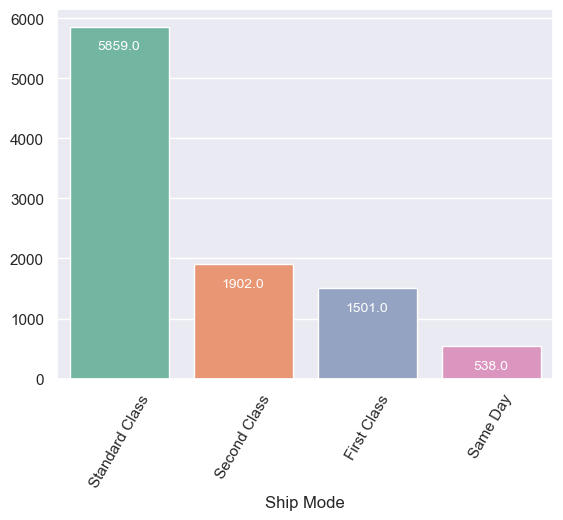

############################## Unique Values Of Segment column ##############################
Segment: 3
############################## Frequencies of Class Values ##############################
             Segment  Ratio
Segment                    
Consumer        5101   0.52
Corporate       2953   0.30
Home Office     1746   0.18


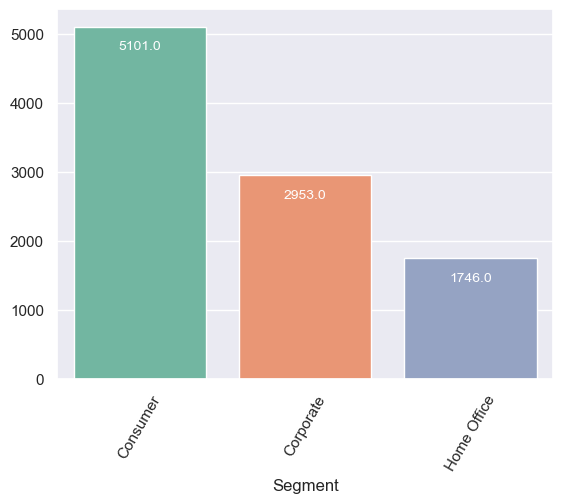

############################## Unique Values Of State column ##############################
State: 49
############################## Frequencies of Class Values ##############################
                State  Ratio
State                       
California       1946   0.20
New York         1097   0.11
Texas             973   0.10
Pennsylvania      582   0.06
Washington        504   0.05
Illinois          483   0.05
Ohio              454   0.05
Florida           373   0.04
Michigan          253   0.03
North Carolina    247   0.03


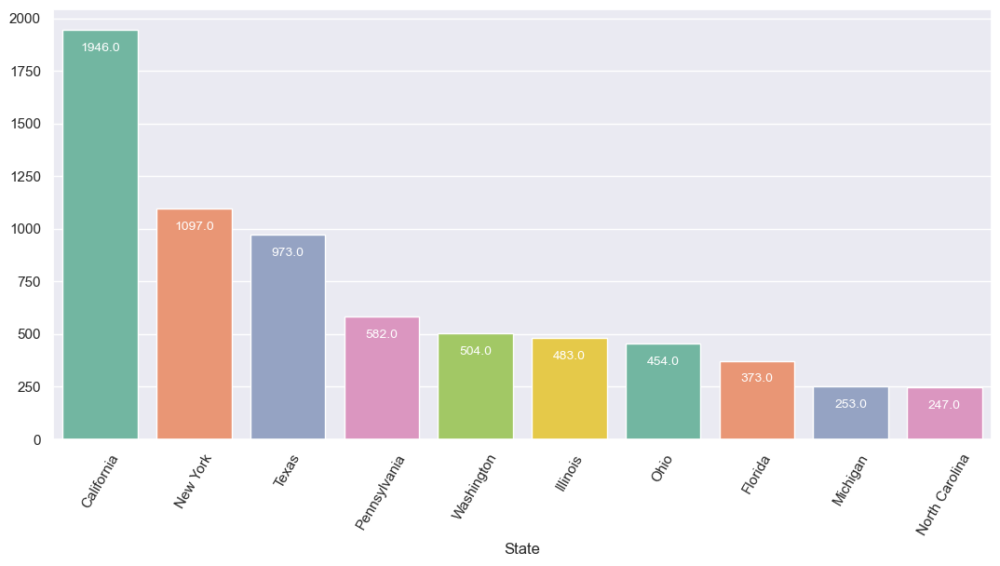

############################## Unique Values Of Region column ##############################
Region: 4
############################## Frequencies of Class Values ##############################
         Region  Ratio
Region                
West       3140   0.32
East       2785   0.28
Central    2277   0.23
South      1598   0.16


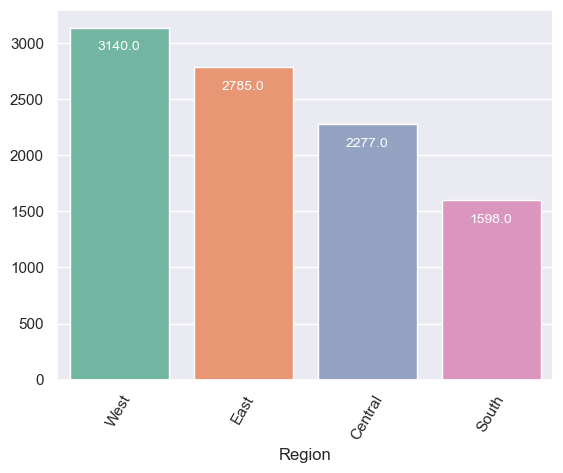

############################## Unique Values Of Category column ##############################
Category: 3
############################## Frequencies of Class Values ##############################
                 Category  Ratio
Category                        
Office Supplies      5909   0.60
Furniture            2078   0.21
Technology           1813   0.18


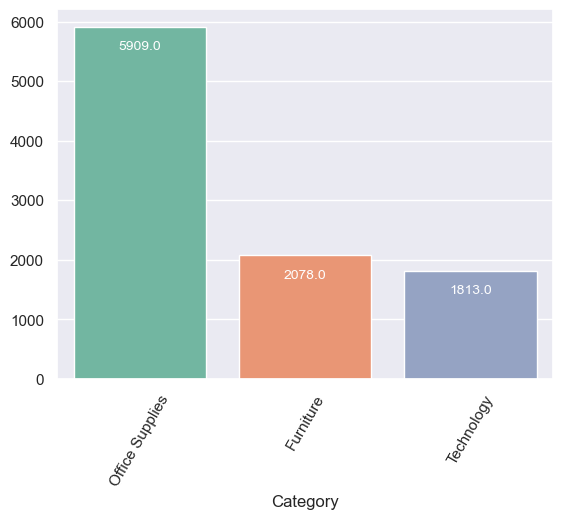

############################## Unique Values Of Sub-Category column ##############################
Sub-Category: 17
############################## Frequencies of Class Values ##############################
              Sub-Category  Ratio
Sub-Category                     
Binders               1492   0.15
Paper                 1338   0.14
Furnishings            931   0.10
Phones                 876   0.09
Storage                832   0.08
Art                    785   0.08
Accessories            756   0.08
Chairs                 607   0.06
Appliances             459   0.05
Labels                 357   0.04


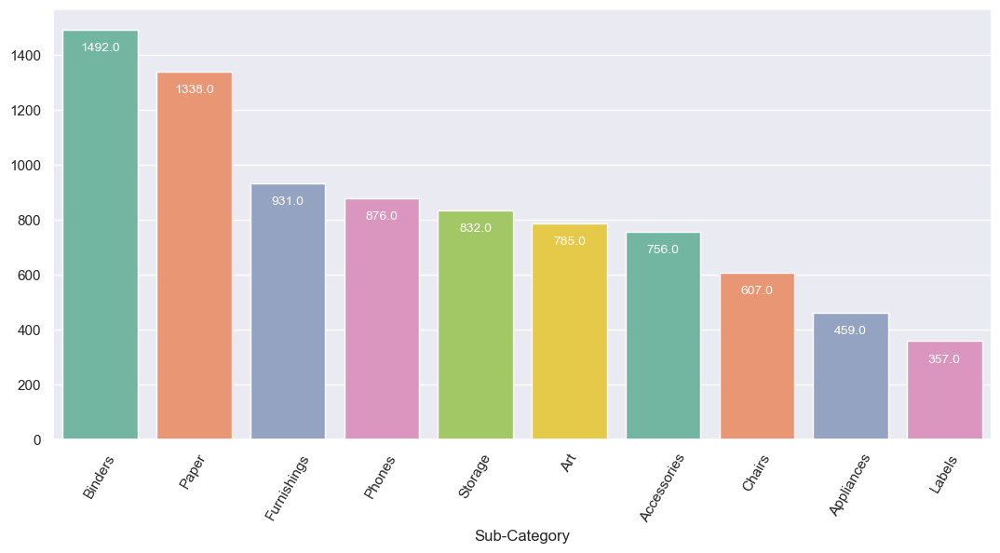

############################## Unique Values Of Customer Name column ##############################
Customer Name: 793
############################## Frequencies of Class Values ##############################
                     Customer Name  Ratio
Customer Name                            
William Brown                   35   0.00
Matt Abelman                    34   0.00
Paul Prost                      34   0.00
John Lee                        33   0.00
Chloris Kastensmidt             32   0.00
Jonathan Doherty                32   0.00
Seth Vernon                     32   0.00
Emily Phan                      31   0.00
Zuschuss Carroll                31   0.00
Arthur Prichep                  31   0.00


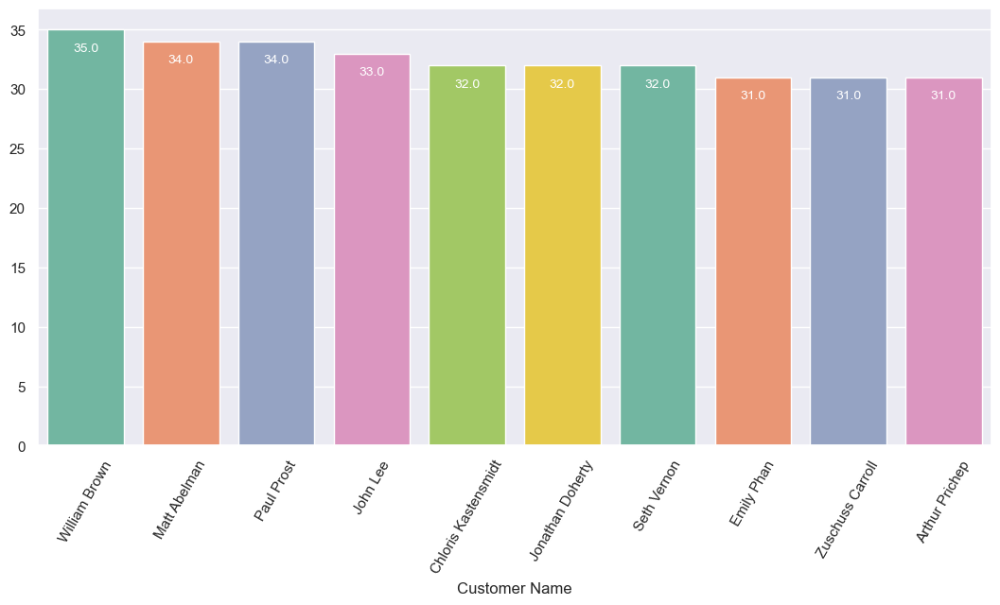

############################## Unique Values Of City column ##############################
City: 529
############################## Frequencies of Class Values ##############################
               City  Ratio
City                      
New York City   891   0.09
Los Angeles     728   0.07
Philadelphia    532   0.05
San Francisco   500   0.05
Seattle         426   0.04
Houston         374   0.04
Chicago         308   0.03
Columbus        221   0.02
San Diego       170   0.02
Springfield     161   0.02


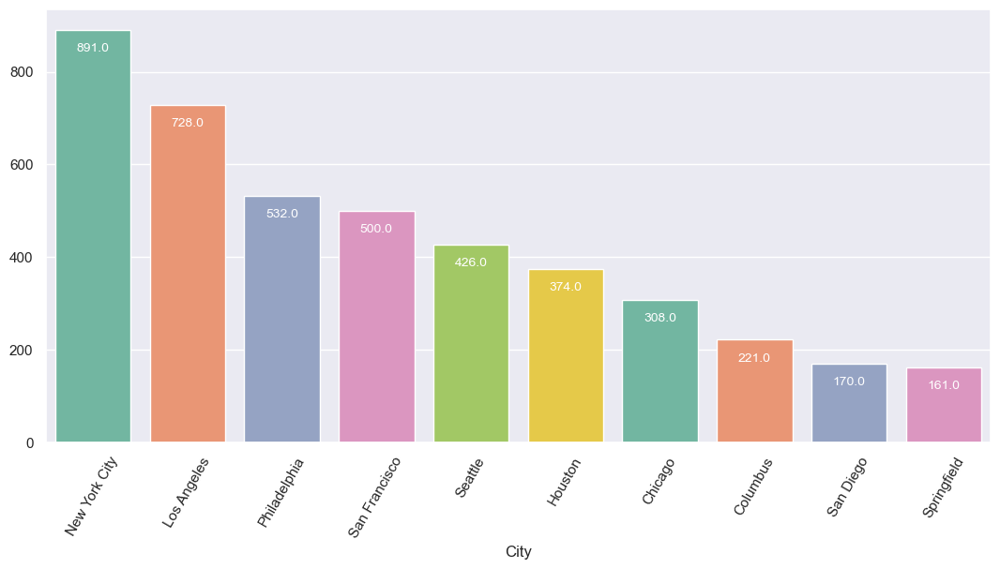

In [10]:
cat_summary(df,True,categorical_columns = categorical_columns,threshold = 10)

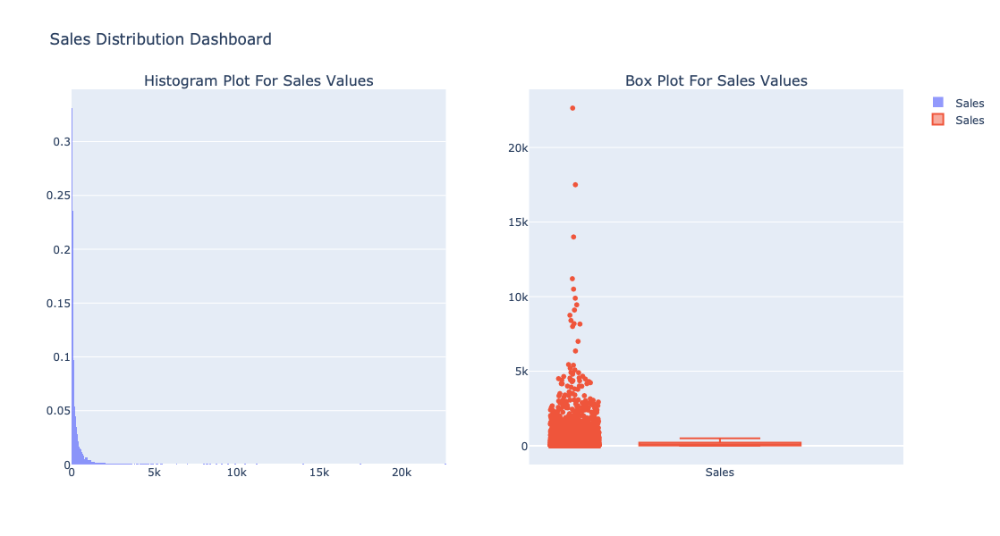

In [11]:
import plotly.graph_objects as go
import plotly.subplots as sp

fig_histogram = go.Figure()

fig_histogram.add_trace(go.Histogram(x=df['Sales'], name='Sales', histnorm='probability', opacity=0.7))

fig_histogram.update_layout(
    title='Sales Distribution (Histogram)',
    xaxis_title='Sales',
    yaxis_title='Probability',
    barmode='overlay',
    bargap=0.1,
    legend=dict(x=0.7, y=0.95),
    autosize=False,
    width=500,
    height=400
)


fig_boxplot = go.Figure()

fig_boxplot.add_trace(go.Box(y=df['Sales'], name='Sales', boxpoints='all', jitter=0.3, pointpos=-1.8))

fig_boxplot.update_layout(
    title='Sales Distribution',
    yaxis_title='Sales',
    autosize=False,
    width=500,
    height=400
)

mean = df['Sales'].mean()
median = df['Sales'].median()
max_value = df['Sales'].max()

fig_histogram.add_shape(
    type='line',
    x0=mean,
    x1=mean,
    y0=0,
    y1=1,
    line=dict(color='red', width=3, dash='dash'),
    name='Mean'
)

fig_histogram.add_shape(
    type='line',
    x0=median,
    x1=median,
    y0=0,
    y1=1,
    line=dict(color='green', width=3, dash='dash'),
    name='Median'
)

fig_histogram.add_shape(
    type='line',
    x0=max_value,
    x1=max_value,
    y0=0,
    y1=1,
    line=dict(color='blue', width=3, dash='dash'),
    name='Max'
)

fig_dashboard = sp.make_subplots(rows=1, cols=2, subplot_titles=("Histogram Plot For Sales Values", "Box Plot For Sales Values"))

fig_dashboard.add_trace(fig_histogram['data'][0], row=1, col=1)
fig_dashboard.add_trace(fig_boxplot['data'][0], row=1, col=2)

fig_dashboard.update_layout(height=600, width=1200, title_text="Sales Distribution Dashboard")

fig_dashboard.show()

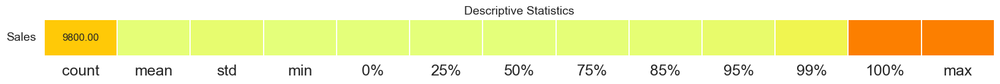

In [12]:
from matplotlib import pyplot as plt
from matplotlib import figure
def desc_stats(dataframe):
    desc = dataframe.describe(percentiles =[0, 0.25, 0.50, 0.75, 0.85, 0.95, 0.99, 1]).T
    desc_df = pd.DataFrame(index= dataframe.columns, 
                           columns= desc.columns,
                           data= desc)
    
    f,ax = plt.subplots(figsize=(20,
                                 desc_df.shape[0]*0.78))
    sns.heatmap(desc_df,
                annot=True,
                cmap = "Wistia",
                fmt= '.2f',
                ax=ax,
                linecolor='white',
                linewidths = 1.3,
                cbar = False,
                annot_kws={"size": 12})
    plt.xticks(size = 18)
    plt.yticks(size = 14,
               rotation = 0)
    plt.title("Descriptive Statistics", size = 14)
    plt.show()


desc_stats(df[[col for col in df.columns if df[col].dtype in ['int64', 'float64'] ]])

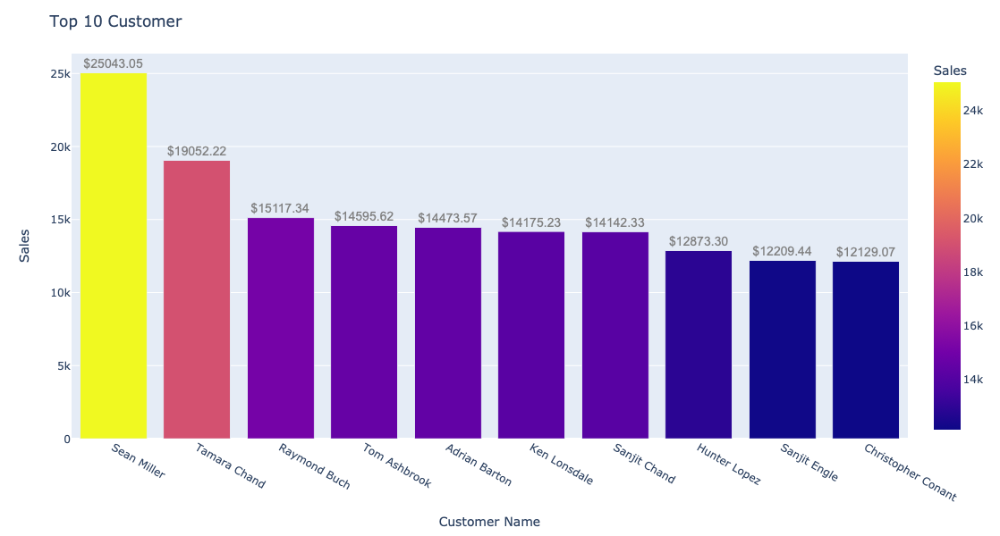

In [13]:
customer_sales = df.groupby('Customer Name').agg({'Sales':"sum"}).reset_index().sort_values(by = "Sales", ascending = False)[:10]


fig = px.bar(customer_sales, x='Customer Name', y='Sales', hover_data=['Customer Name', 'Sales'],
             labels={'Customer Name': 'Customer Name', 'Sales': 'Sales'}, 
             color = 'Sales')


fig.update_traces(hovertemplate='Customer Name: %{x}<br>Sales: $%{y}<extra></extra>')

fig.update_layout(title='Top 10 Customer',width=1200, height=600)

fig.update_traces(text=customer_sales['Sales'], 
                  texttemplate='$%{text:.2f}', 
                  textfont=dict(color='gray', size=14, family='Arial'),
                  textangle=0,textposition='outside')


fig.show()

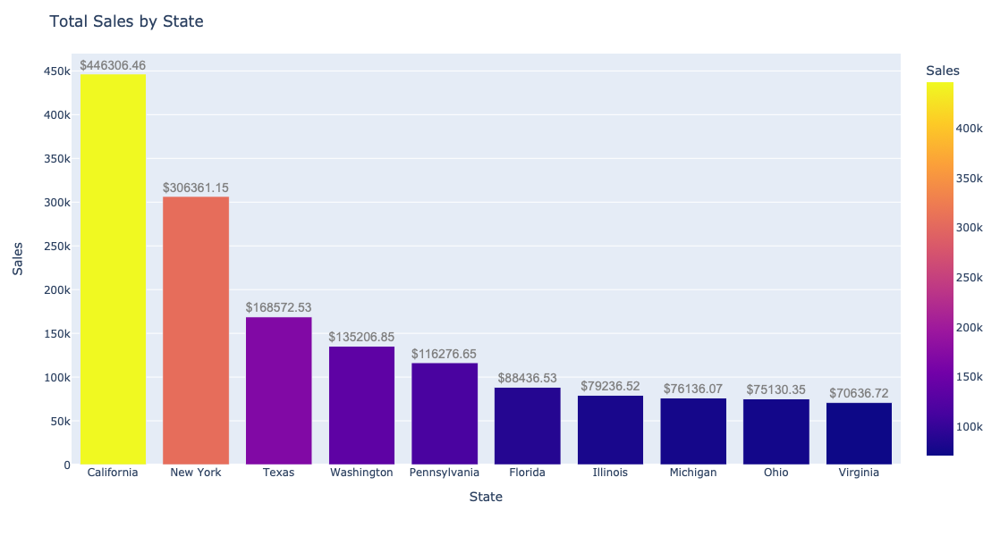

In [14]:
state_sales = df.groupby('State').agg({'Sales':"sum", "Order ID": lambda orderid: orderid.nunique()}).reset_index().sort_values(by = "Sales", ascending = False)[:10]



fig = px.bar(state_sales, x='State', y='Sales', hover_data=['State', 'Sales'],
             labels={'State': 'State', 'Sales': 'Sales'}, 
             color = 'Sales')


fig.update_traces(hovertemplate='State: %{x}<br>Sales: $%{y}<extra></extra>')

fig.update_layout(title='Total Sales by State',width=1200, height=600)

fig.update_traces(text=state_sales['Sales'], 
                  texttemplate='$%{text:.2f}', 
                  textfont=dict(color='gray', size=14, family='Arial'),
                  textangle=0,textposition='outside')


fig.show()

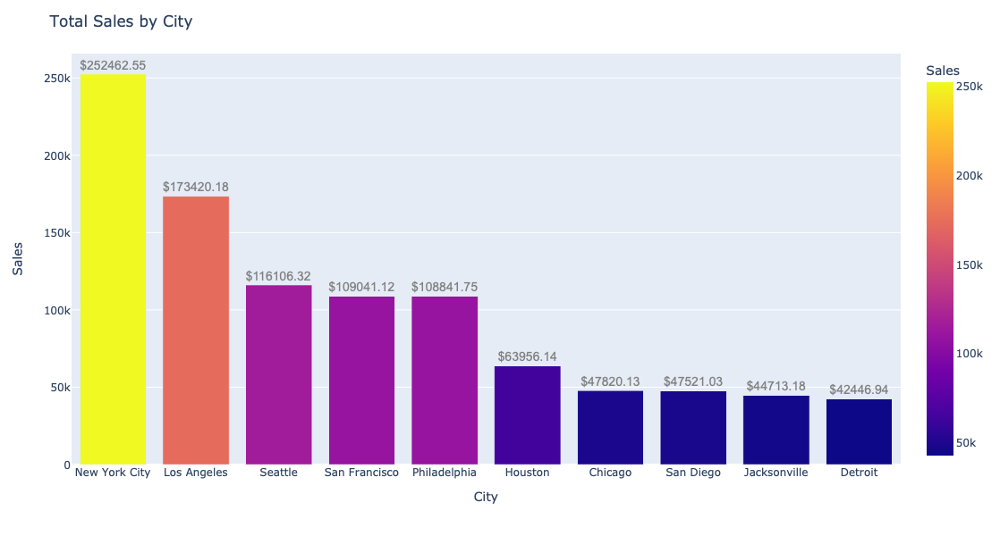

In [15]:
city_sales = df.groupby('City').agg({'Sales':"sum", "Order ID": lambda orderid: orderid.nunique()}).reset_index().sort_values(by = "Sales", ascending = False)[:10]



fig = px.bar(city_sales, x='City', y='Sales', hover_data=['City', 'Sales'],
             labels={'City': 'City', 'Sales': 'Sales'}, 
             color = 'Sales')


fig.update_traces(hovertemplate='City: %{x}<br>Sales: $%{y}<extra></extra>')

fig.update_layout(title='Total Sales by City',width=1200, height=600)

fig.update_traces(text=city_sales['Sales'], 
                  texttemplate='$%{text:.2f}', 
                  textfont=dict(color='gray', size=14, family='Arial'),
                  textangle=0,textposition='outside')


fig.show()

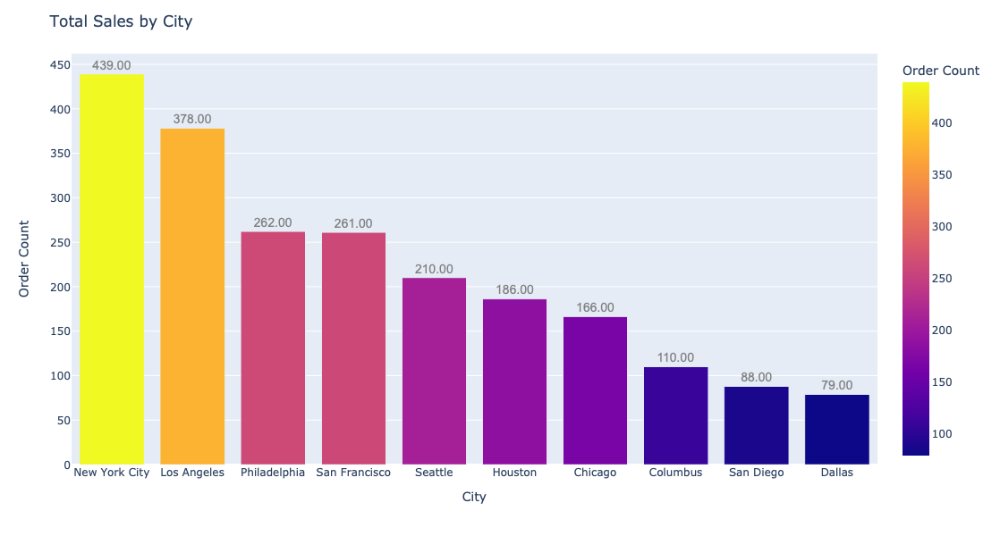

In [16]:
city_sales = df.groupby('City').agg({"Order ID": lambda orderid: orderid.nunique()}).rename(columns = {'Order ID' : 'Order Count'}).reset_index().sort_values(by = "Order Count", ascending = False)[:10]



fig = px.bar(city_sales, x='City', y='Order Count', hover_data=['City', 'Order Count'],
             labels={'City': 'City', 'Order Count': 'Order Count'}, 
             color = 'Order Count')


fig.update_traces(hovertemplate='City: %{x}<br>Order Count: $%{y}<extra></extra>')

fig.update_layout(title='Total Sales by City',width=1200, height=600)

fig.update_traces(text=city_sales['Order Count'], 
                  texttemplate='%{text:.2f}', 
                  textfont=dict(color='gray', size=14, family='Arial'),
                  textangle=0,textposition='outside')


fig.show()

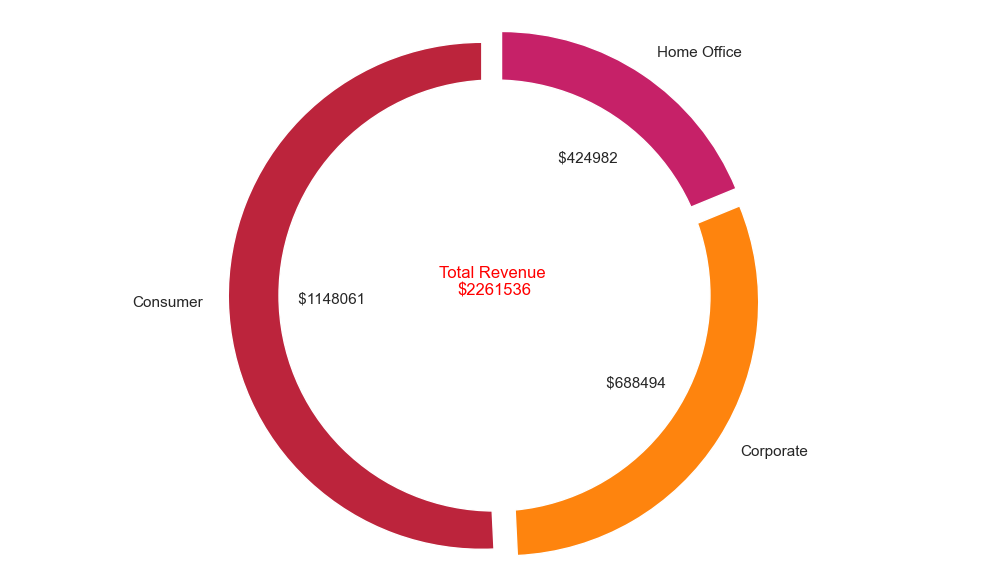

In [17]:
segment_sales = df.groupby('Segment').agg({"Sales":"sum"}).sort_values(by = "Sales", ascending = False)
segment_sales = segment_sales[['Sales']]
segment_sales .reset_index(inplace = True)
total_revenues = segment_sales["Sales"].sum() 
total_revenues = str(int(total_revenues))
total_revenues = '$' + total_revenues 


plt.rcParams["figure.figsize"] = (10,6) 
plt.rcParams['font.size'] = 11.0 
plt.rcParams['font.weight'] = 6 
colors = ['#BC243C','#FE840E','#C62168'] 
explode = (0.05,0.05,0.05)
fig1, ax1 = plt.subplots()
ax1.pie(segment_sales['Sales'], colors = colors, labels=segment_sales['Segment'], autopct= autopct_format(segment_sales['Sales']),startangle=90,explode=explode)
centre_circle = plt.Circle((0,0),0.85,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
ax1.axis('equal') 
label = ax1.annotate('Total Revenue \n'+str(total_revenues),color = 'red', xy=(0, 0), fontsize=12, ha="center")
plt.tight_layout()
plt.show()

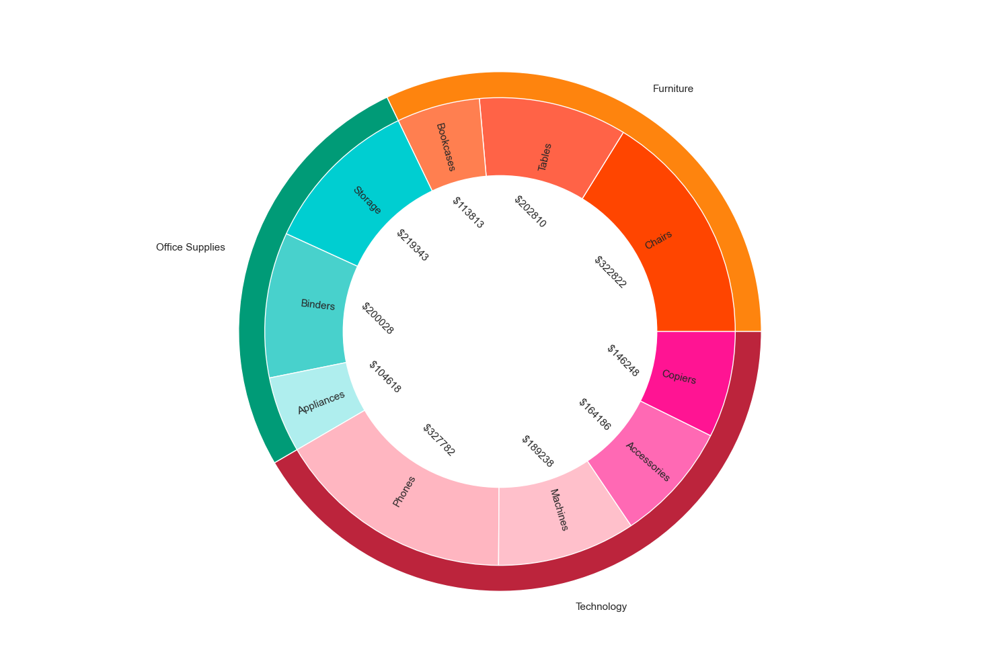

In [18]:
topcat_subcat = df.groupby(['Category','Sub-Category']).agg({'Sales':'sum'}).sort_values(by = "Sales", ascending=False)[:10]
topcat_subcat = topcat_subcat[["Sales"]].astype(int)
topcat_subcat = topcat_subcat.sort_values("Category")
topcat_subcat.reset_index(inplace=True)
topcat_subcat_1 = topcat_subcat.groupby(['Category']).agg({'Sales':'sum'})
topcat_subcat_1.reset_index(inplace=True)


plt.rcParams["figure.figsize"] = (15,10) 
fig, ax = plt.subplots()
ax.axis('equal')
width = 0.1
outer_colors = ['#FE840E','#009B77','#BC243C']
inner_colors = ['Orangered','tomato','coral',"darkturquoise","mediumturquoise","paleturquoise","lightpink","pink","hotpink","deeppink"]
pie = ax.pie(topcat_subcat_1['Sales'], radius=1, labels=topcat_subcat_1['Category'],colors=outer_colors,wedgeprops=dict(edgecolor='w'))
pie2 = ax.pie(topcat_subcat['Sales'], radius=1-width, labels=topcat_subcat['Sub-Category'],autopct= autopct_format(topcat_subcat['Sales']),labeldistance=0.7,colors=inner_colors,wedgeprops=dict(edgecolor='w'), pctdistance=0.53,rotatelabels =True)
fraction_text_list = pie2[2]
for text in fraction_text_list: 
    text.set_rotation(315) 
centre_circle = plt.Circle((0,0),0.6,fc='white') 
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
ax1.axis('equal')  
plt.tight_layout()
plt.show()

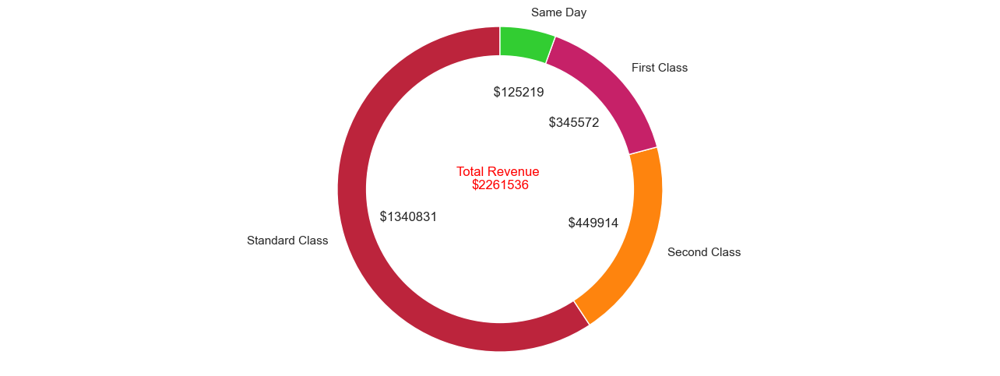

In [19]:
Top_shipping = df.groupby(["Ship Mode"]).agg({'Sales':'sum'}).sort_values(by = "Sales", ascending=False) 
Top_shipping = Top_shipping[["Sales"]]
Top_shipping.reset_index(inplace=True)
total_revenue_ship = Top_shipping["Sales"].sum()
total_revenue_ship = str(int(total_revenue_ship))
total_revenue_ship = '$' + total_revenue_ship 



plt.rcParams["figure.figsize"] = (13,5) 
plt.rcParams['font.size'] = 12.0 
plt.rcParams['font.weight'] = 6 
colors = ['#BC243C','#FE840E','#C62168',"limegreen"] 
fig1, ax1 = plt.subplots()
ax1.pie(Top_shipping['Sales'], colors = colors, labels=Top_shipping['Ship Mode'], autopct= autopct_format(Top_shipping['Sales']), startangle=90)
centre_circle = plt.Circle((0,0),0.82,fc='white') 
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

ax1.axis('equal') 
label = ax1.annotate('Total Revenue \n'+str(total_revenue_ship),color = 'red', xy=(0, 0), fontsize=12, ha="center")
plt.tight_layout()
plt.show()

In [20]:
df_pop_items = df[['Product Name', 'Sales', 'Order ID']].groupby(['Product Name']).agg({'Sales' : 'sum','Order ID' : 'count'}).rename(columns = {'Order ID' : 'Order Count', 'Sales' : 'Total Sales'}).reset_index().sort_values(by  = 'Order Count', ascending = False)[:10]
df_pop_items2 = df[['Product Name', 'Sales', 'Order ID']].groupby(['Product Name']).agg({'Sales' : 'sum','Order ID' : 'count'}).rename(columns = {'Order ID' : 'Order Count', 'Sales' : 'Total Sales'}).reset_index().sort_values(by  = 'Total Sales', ascending = False)[:10]

print('Best Selling Products (By Order Amount)' , df_pop_items, sep = '\n', end = '\n\n\n')
print('Best Selling Products (By Sales Amount)' , df_pop_items2, sep = '\n', end = '\n\n')

Best Selling Products (By Order Amount)
                                           Product Name  Total Sales  Order Count
1492                                    Staple envelope      1675.65           47
1498                                            Staples       755.47           46
537                                   Easy-staple paper      2414.16           44
259                             Avery Non-Stick Binders       217.32           20
1495                                     Staple remover       263.09           18
1499                            Staples in misc. colors       459.66           18
941                          KI Adjustable-Height Table      4466.66           17
1510                            Storex Dura Pro Binders       278.59           17
1496                         Staple-based wall hangings       422.29           16
992   Logitech 910-002974 M325 Wireless Mouse for We...      1409.53           15


Best Selling Products (By Sales Amount)
                

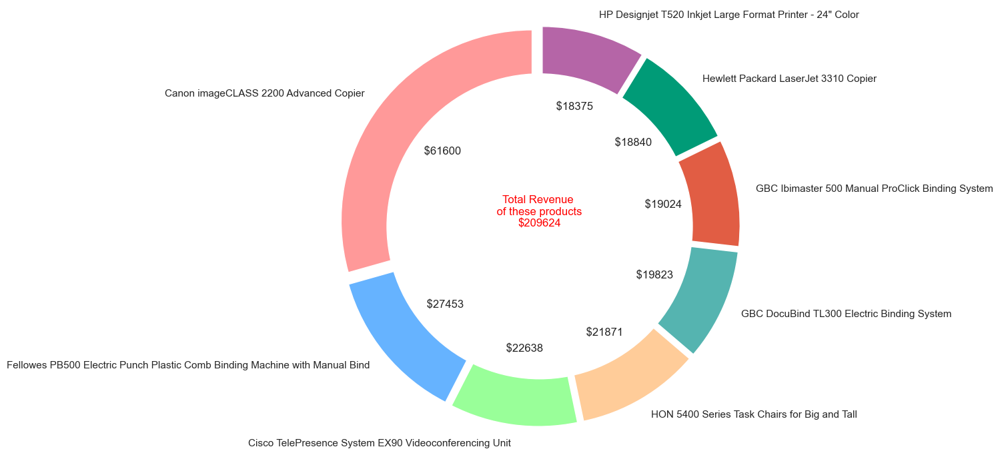

In [21]:
Top_products = df.groupby(["Product Name"]).agg({'Sales':'sum'}).sort_values("Sales",ascending=False).head(8) 
Top_products = Top_products[["Sales"]].round(2)
Top_products.reset_index(inplace=True) 
total_revenue_products = '$' +str(int(Top_products["Sales"].sum())) 

plt.rcParams["figure.figsize"] = (13,7)
plt.rcParams['font.size'] = 12.0 
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#55B4B0','#E15D44','#009B77','#B565A7'] # colors are defined for the pie chart
explode = (0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05)
fig1, ax1 = plt.subplots()
ax1.pie(Top_products['Sales'], colors = colors, labels=Top_products['Product Name'], autopct= autopct_format(Top_products['Sales']), startangle=90,explode=explode)
centre_circle = plt.Circle((0,0),0.80,fc='white') 
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

ax1.axis('equal')  
label = ax1.annotate('Total Revenue \n of these products \n'+str(total_revenue_products),color = 'red', xy=(0, 0), fontsize=12, ha="center")
plt.tight_layout()
plt.show()

In [22]:
df_time = df.copy()
df_time['Order Date'] = pd.to_datetime(df['Order Date'], format='%d/%m/%Y')
df_time['Ship Date'] = pd.to_datetime(df['Ship Date'], format='%d/%m/%Y')
print('Describing Informations About Order Date' , df_time['Order Date'].describe().T, sep = '\n\n', end = '\n\n\n')
print('Describing Informations About Ship Date' , df_time['Ship Date'].describe().T, sep = '\n\n', end = '\n\n')

Describing Informations About Order Date

count                             3959
mean     2017-03-14 18:19:11.199798016
min                2015-01-02 00:00:00
25%                2016-04-05 00:00:00
50%                2017-05-02 00:00:00
75%                2018-03-07 00:00:00
max                2018-12-11 00:00:00
Name: Order Date, dtype: object


Describing Informations About Ship Date

count                             3815
mean     2017-04-09 17:04:02.516382720
min                2015-01-04 00:00:00
25%                2016-04-12 00:00:00
50%                2017-06-06 00:00:00
75%                2018-05-01 00:00:00
max                2019-05-01 00:00:00
Name: Ship Date, dtype: object



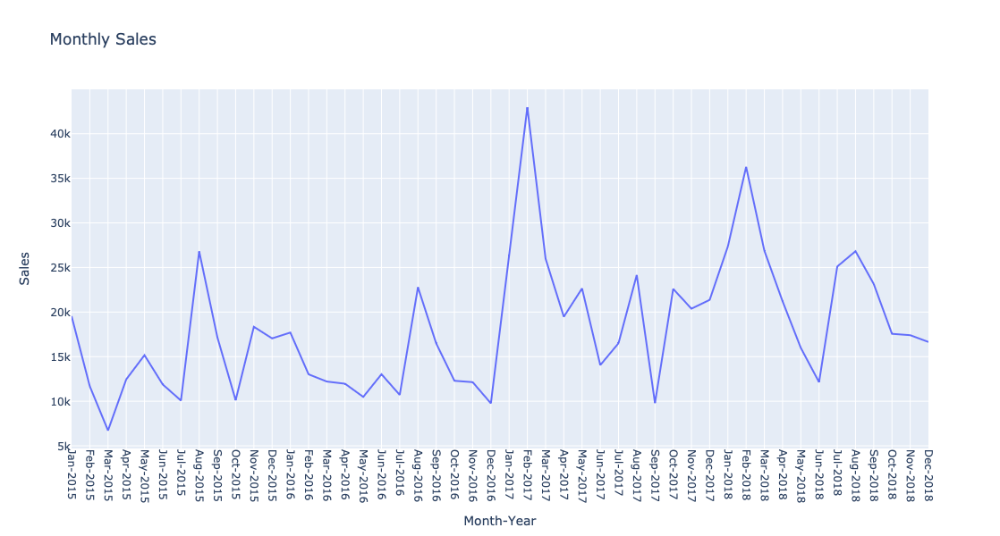

In [23]:
df_time['Month-Year'] = df_time['Order Date'].dt.strftime('%b-%Y')

monthly_sales = df_time.groupby('Month-Year').agg({'Sales': 'sum'}).reset_index()
monthly_sales['Order'] = pd.to_datetime(monthly_sales['Month-Year'], format='%b-%Y')
monthly_sales = monthly_sales.sort_values('Order')


fig = px.line(monthly_sales, x='Month-Year', y='Sales', title='Monthly Sales',
              labels={'Month-Year': 'Month-Year', 'Sales': 'Sales'})

fig.update_traces(hovertemplate='Date: %{x}<br>Sales: %{y:,.2f}<extra></extra>')


fig.update_xaxes(tickangle=90, tickmode='array', tickvals=monthly_sales['Month-Year'],
                 ticktext=monthly_sales['Month-Year'])


fig.update_layout(width=900, height=600)


fig.show()

In [24]:
def time_breakdown(dataframe = dataset, date_col = 'Order Date',categorical_columns = cat_cols, threshold = 15):
    dataframe[f'Month_Year_{date_col}'] = dataframe[date_col].dt.strftime('%b-%Y')
    for cat_col in categorical_columns:
        if dataframe[cat_col].nunique() <= threshold:
            monthly_sales = dataframe.groupby([f'Month_Year_{date_col}',cat_col]).agg({'Sales': 'sum'}).reset_index()
            monthly_sales['Order'] = pd.to_datetime(monthly_sales[f'Month_Year_{date_col}'], format='%b-%Y')
            monthly_sales = monthly_sales.sort_values('Order')


            fig = px.line(monthly_sales, x=f'Month_Year_{date_col}', y='Sales', title='Monthly Sales',
              labels={f'Month-Year_{date_col}': f'Month_Year_{date_col}', 'Sales': 'Sales'}, color = cat_col)

            fig.update_traces(hovertemplate='Date: %{x}<br>Sales: %{y:,.2f}<extra></extra>')


            fig.update_xaxes(tickangle=90, tickmode='array', tickvals=monthly_sales[f'Month_Year_{date_col}'],
                     ticktext=monthly_sales[f'Month_Year_{date_col}'])


            fig.update_layout(width=1000, height=600)


            fig.show()

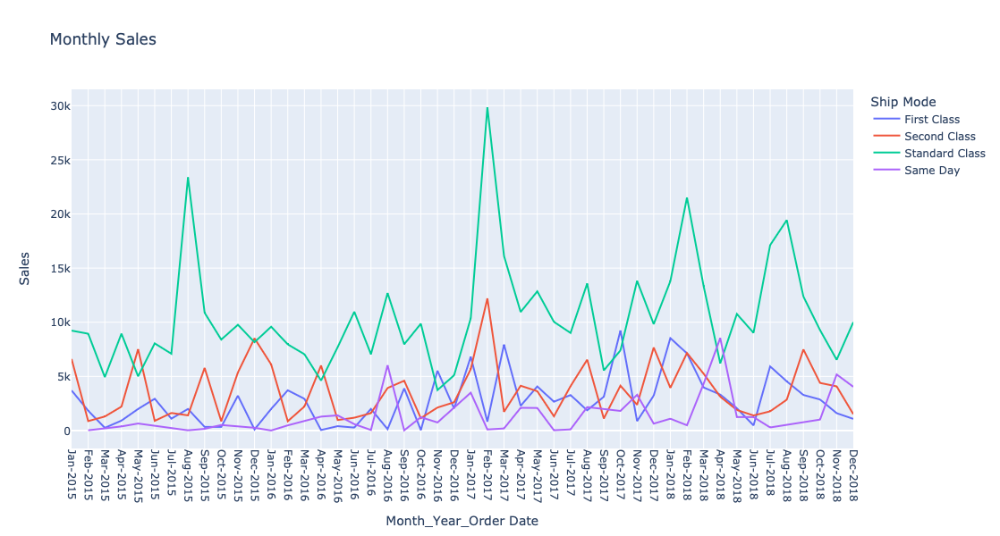

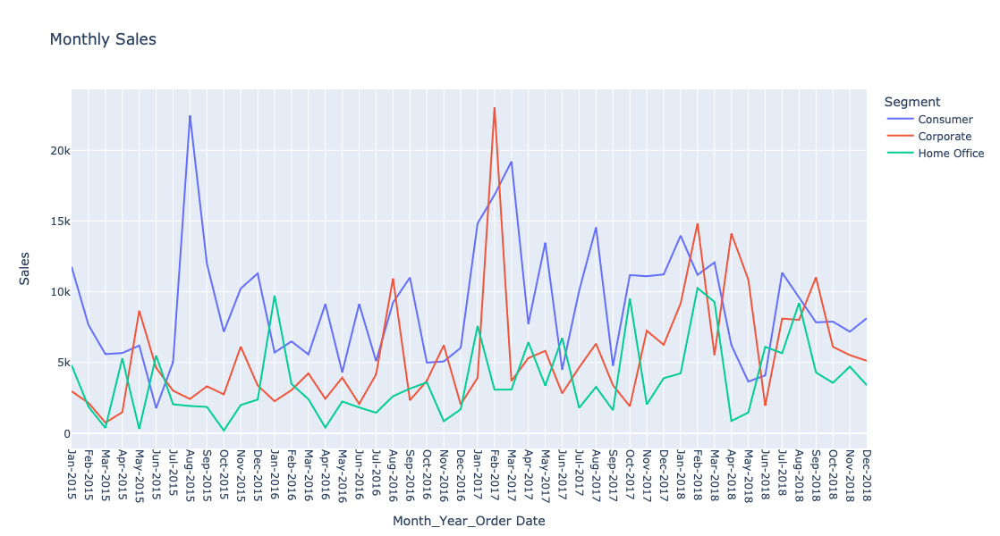

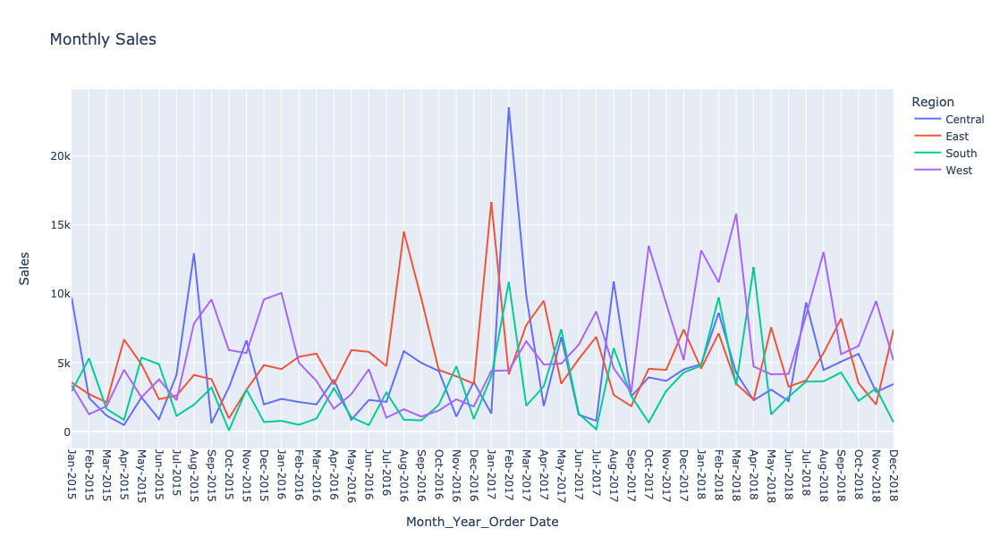

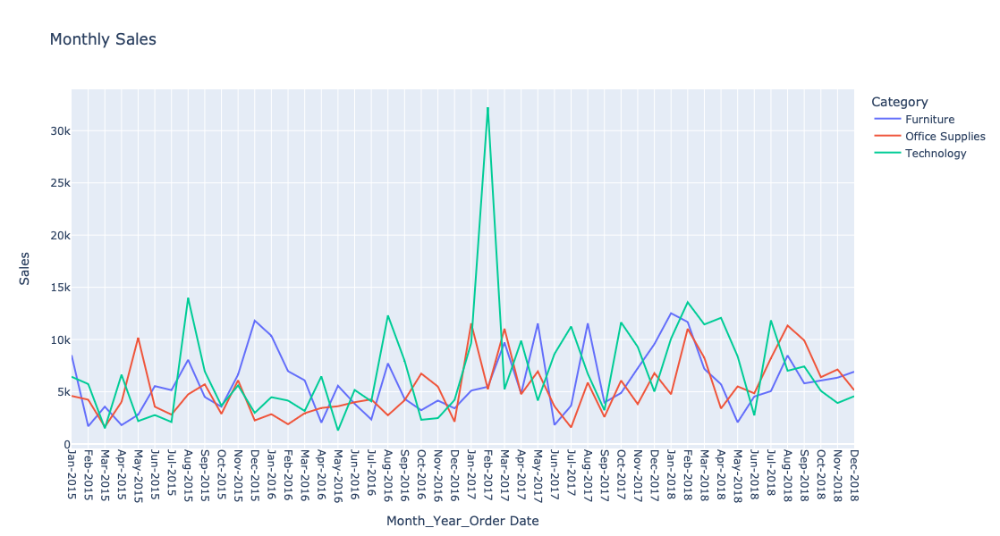

In [25]:
time_breakdown(df_time, 'Order Date', categorical_columns = categorical_columns, threshold = 10)

In [27]:
df_time['WeekDay'] = df_time['Order Date'].dt.day_name()

In [29]:
start_date = df_time['Order Date'].min()

In [33]:
start_date

Timestamp('2015-01-02 00:00:00')

In [34]:
df_time['Order Date']

0      2017-08-11
1      2017-08-11
2      2017-12-06
3      2016-11-10
4      2016-11-10
5      2015-09-06
6      2015-09-06
7      2015-09-06
8      2015-09-06
9      2015-09-06
10     2015-09-06
11     2015-09-06
12            NaT
13     2017-05-12
14            NaT
15            NaT
16     2015-11-11
17            NaT
18            NaT
19            NaT
20            NaT
21     2017-09-12
22     2017-09-12
23            NaT
24            NaT
25            NaT
26            NaT
27            NaT
28            NaT
29            NaT
30            NaT
31            NaT
32            NaT
33            NaT
34            NaT
35     2017-08-12
36     2017-08-12
37            NaT
38            NaT
39            NaT
40            NaT
41     2018-10-09
42            NaT
43            NaT
44     2017-11-03
45     2017-11-03
46            NaT
47            NaT
48            NaT
49            NaT
50            NaT
51            NaT
52            NaT
53     2017-11-12
54     2017-11-12
55        

df_time['Week'] = ((((df_time['Order Date'] - start_date).dt.days)/7) +1).astype(int)

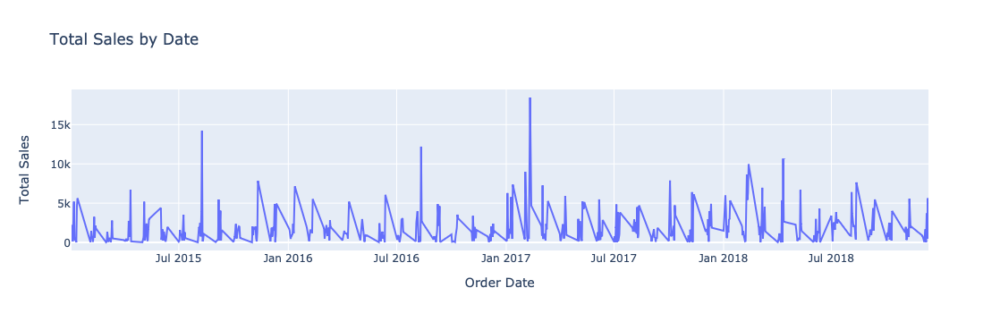

In [36]:
df_plot = df_time.groupby('Order Date').agg({'Sales':'sum'}).rename(columns = {'Sales':'Total Sales'}).reset_index().sort_values(by = 'Order Date', ascending = True)

fig = px.line(df_plot, x="Order Date", y="Total Sales", title='Total Sales by Date')
fig.show()

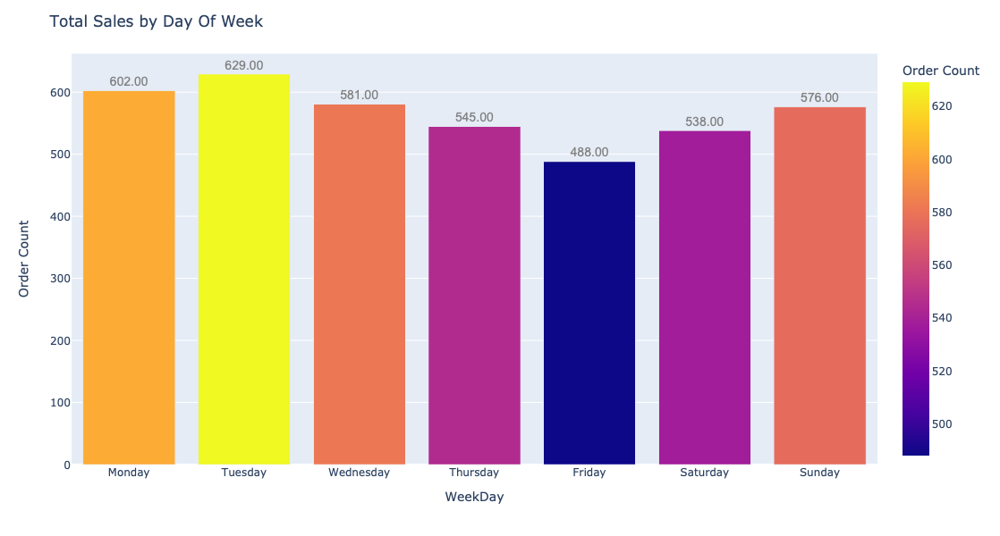

In [37]:
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

df_plot_dayofweek = df_time[['WeekDay', 'Sales', 'Order ID']].groupby(['WeekDay']).agg({'Sales': 'sum', 'Order ID': 'count'}).rename(columns = {'Sales': 'Total Sales', 'Order ID':'Order Count'}).reset_index()

df_plot_dayofweek = df_plot_dayofweek.set_index('WeekDay').loc[day_order].reset_index()

fig_dayofweek = px.bar(df_plot_dayofweek, x = 'WeekDay', y = 'Order Count',hover_data=['WeekDay', 'Order Count'], 
                       labels={'WeekDay': 'WeekDay', 'Order Count': 'Order Count'}, 
                       color = 'Order Count')
    
fig_dayofweek.update_traces(hovertemplate='WeekDay: %{x}<br>Order Count: %{y}<extra></extra>')

fig_dayofweek.update_layout(title='Total Sales by Day Of Week',width=1200, height=600)

fig_dayofweek.update_traces(text=df_plot_dayofweek['Order Count'], 
                  texttemplate='%{text:.2f}', 
                  textfont=dict(color='gray', size=14, family='Arial'),
                  textangle=0,textposition='outside')
fig_dayofweek.show()

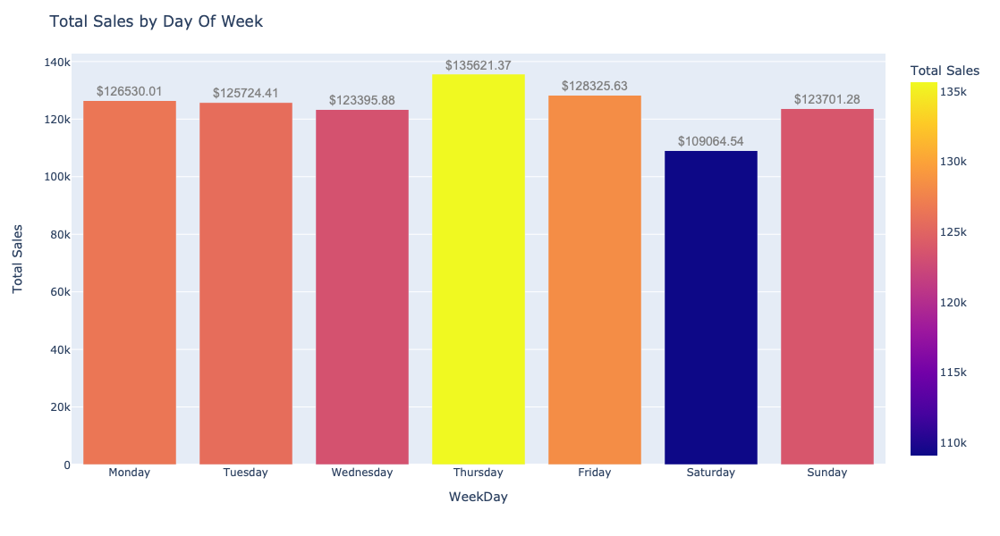

In [38]:
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

df_plot_dayofweek = df_time[['WeekDay', 'Sales', 'Order ID']].groupby(['WeekDay']).agg({'Sales': 'sum', 'Order ID': 'count'}).rename(columns = {'Sales': 'Total Sales', 'Order ID':'Order Count'}).reset_index()

df_plot_dayofweek = df_plot_dayofweek.set_index('WeekDay').loc[day_order].reset_index()

fig_dayofweek = px.bar(df_plot_dayofweek, x = 'WeekDay', y = 'Total Sales',hover_data=['WeekDay', 'Total Sales'], 
                       labels={'WeekDay': 'WeekDay', 'Total Sales': 'Total Sales'}, 
                    color = 'Total Sales')
    
fig_dayofweek.update_traces(hovertemplate='WeekDay: %{x}<br>Total Sales: $%{y}<extra></extra>')

fig_dayofweek.update_layout(title='Total Sales by Day Of Week',width=1200, height=600)

fig_dayofweek.update_traces(text=df_plot_dayofweek['Total Sales'], 
                  texttemplate='$%{text:.2f}', 
                  textfont=dict(color='gray', size=14, family='Arial'),
                  textangle=0,textposition='outside')
fig_dayofweek.show()

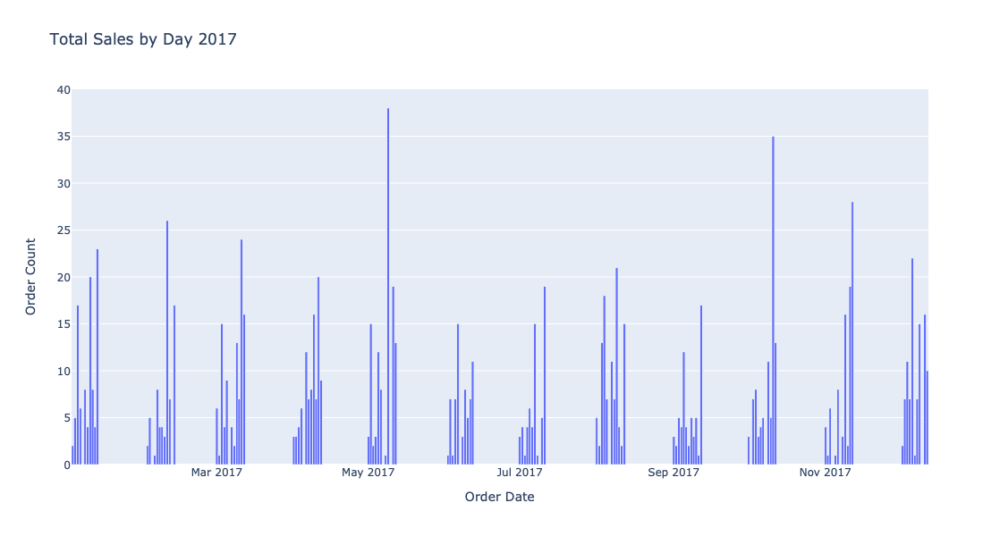

In [39]:
SINGLE_YEAR = 2017

df_sales_single_year = df_time[df_time['Order Date'].dt.year == SINGLE_YEAR]
df_plot_single_year = df_sales_single_year[['Order Date','Sales','Order ID']].groupby(['Order Date']).agg({'Sales': 'sum', 'Order ID':'count'}).rename(columns = {'Sales':'Total Sales', 'Order ID': 'Order Count'}).reset_index() 
fig = px.bar(df_plot_single_year, x='Order Date', y='Order Count',facet_col_spacing=0, title=f'Total Sales by Day {SINGLE_YEAR}')
fig.update_layout(bargap=0.0,bargroupgap=0.0, height = 600, width = 1200)
fig.show()

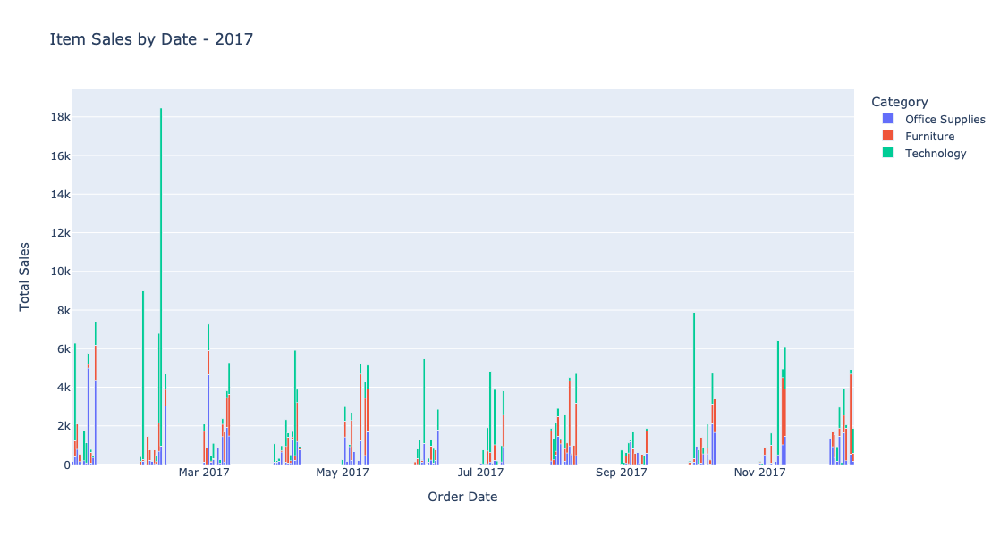

In [40]:
df_plot = df_sales_single_year[['Order Date','Category', 'Sales','Order ID']].groupby(['Order Date','Category']).agg({'Sales':'sum', 'Order ID':'count'}).rename(columns = {'Sales': 'Total Sales', 'Order ID': 'Order Count'}).reset_index()
fig = px.bar(df_plot, x='Order Date', y='Total Sales',color="Category", title=f'Item Sales by Date - {SINGLE_YEAR}')
fig.update_layout(bargap=0.0,bargroupgap=0.0, height = 600, width = 1200, showlegend = True)
fig.show()

In [41]:
df_plot_weekly = df_sales_single_year[['Week','Category','Order ID','Sales']].groupby(['Week','Category']).agg({'Sales':'sum', 'Order ID': 'count'}).rename(columns = {'Sales': 'Total Sales', 'Order ID' : 'Order Count'}).reset_index()
fig = px.bar(df_plot_weekly, x='Week', y='Total Sales',color="Category", title=f'Total Sales by Week - {SINGLE_YEAR}')
fig.update_layout(bargap=0.0,bargroupgap=0.0, height = 600 , width = 1200, showlegend = True)
fig.show()

KeyError: "['Week'] not in index"

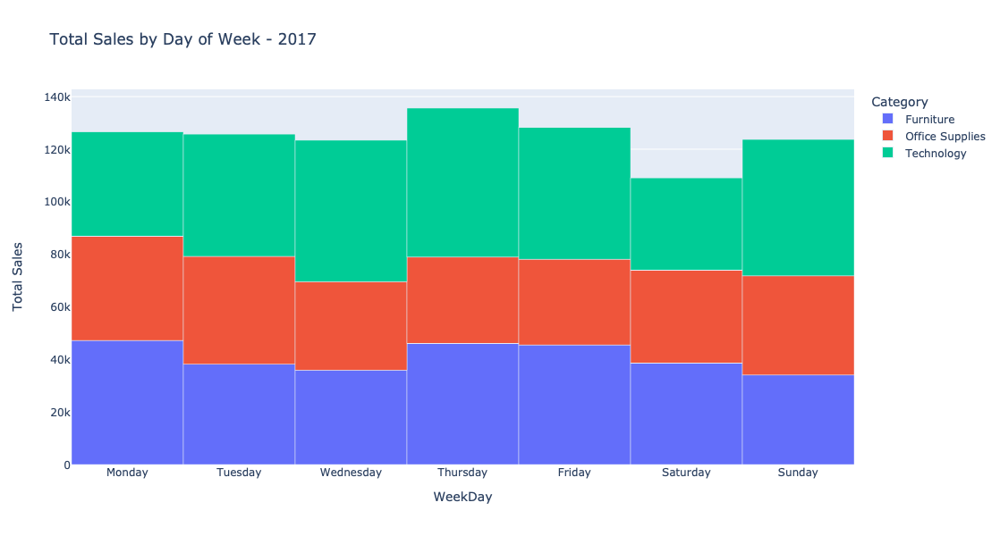

In [42]:
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

df_plot_daily = df_time[['WeekDay','Category','Sales']].groupby(['WeekDay','Category']).agg({'Sales':'sum'}).rename(columns = {'Sales':'Total Sales'}).reset_index()
df_plot_daily = df_plot_daily.set_index('WeekDay').loc[day_order].reset_index()
fig = px.bar(df_plot_daily, x='WeekDay', y='Total Sales',color="Category", title=f'Total Sales by Day of Week - {SINGLE_YEAR}')
fig.update_layout(bargap=0.0,bargroupgap=0.0, height = 600 , width = 900, showlegend = True)
fig.show()

In [43]:
df_pop_cats = df_time[['Sub-Category', 'Sales', 'Order ID']].groupby(['Sub-Category']).agg({'Sales' : 'sum',"Order ID": lambda orderid: orderid.nunique()}).rename(columns = {'Order ID' : 'Order Amount', 'Sales' : 'Total Sales'}).reset_index().sort_values(by  = 'Total Sales', ascending = False)
df_pop_cats[:10]

,Sub-Category,Total Sales,Order Amount
13,Phones,327782.45,803
5,Chairs,322822.73,566
14,Storage,219343.39,764
16,Tables,202810.63,302
3,Binders,200028.79,1291
11,Machines,189238.63,112
0,Accessories,164186.70,702
6,Copiers,146248.09,66
4,Bookcases,113813.20,222
1,Appliances,104618.40,444


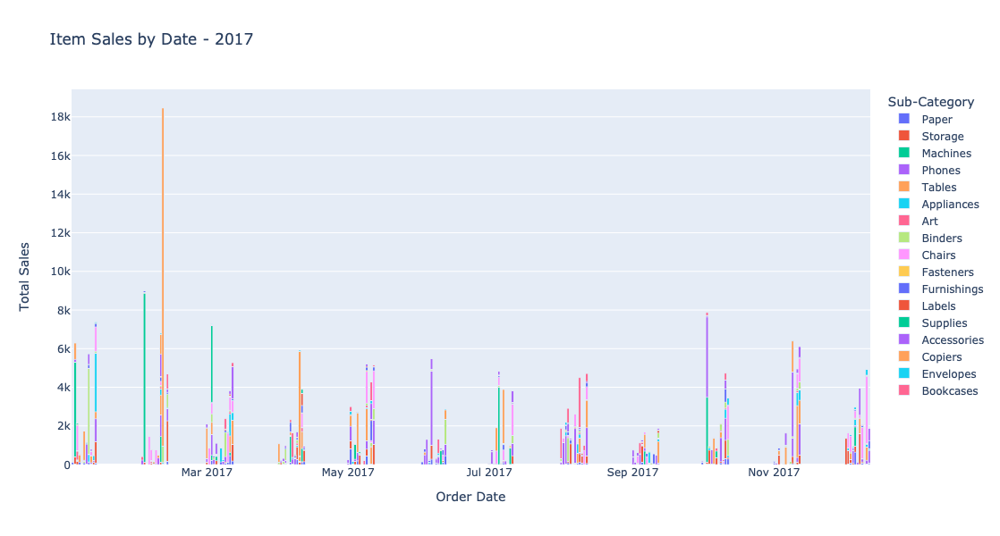

In [44]:
df_plot_sc = df_sales_single_year[['Order Date','Sub-Category', 'Sales']].groupby(['Order Date','Sub-Category']).agg({'Sales':'sum'}).rename(columns = {'Sales': 'Total Sales'}).reset_index()
fig = px.bar(df_plot_sc, x='Order Date', y='Total Sales',color="Sub-Category", title=f'Item Sales by Date - {SINGLE_YEAR}')
fig.update_layout(bargap=0.0,bargroupgap=0.0, height = 600, width = 900)
fig.show()

In [45]:
df_plot_sc_weekly = df_sales_single_year[['Week','Sub-Category','Sales']].groupby(['Week','Sub-Category']).agg({'Sales':'sum'}).rename(columns = {'Sales': 'Total Sales'}).reset_index()
fig = px.bar(df_plot_sc_weekly, x='Week', y='Total Sales',color="Sub-Category", title=f'Total Sales by Week - {SINGLE_YEAR}')
fig.update_layout(bargap=0.0,bargroupgap=0.0, height = 600 , width = 900)
fig.show()

KeyError: "['Week'] not in index"

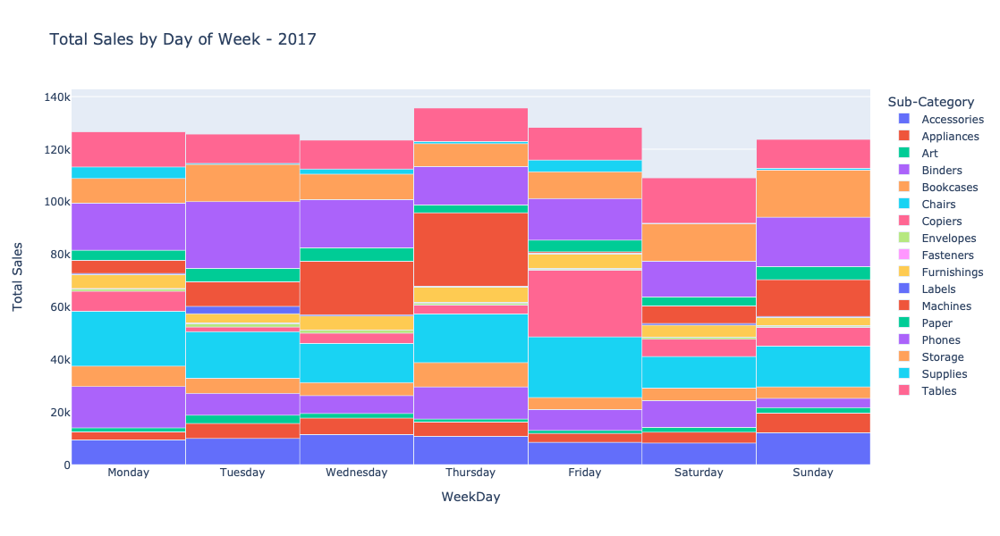

In [46]:
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

df_plot_sc_daily = df_time[['WeekDay','Sub-Category','Sales']].groupby(['WeekDay','Sub-Category']).agg({'Sales':'sum'}).rename(columns = {'Sales':'Total Sales'}).reset_index()
df_plot_sc_daily = df_plot_sc_daily.set_index('WeekDay').loc[day_order].reset_index()
fig = px.bar(df_plot_sc_daily, x='WeekDay', y='Total Sales',color="Sub-Category", title=f'Total Sales by Day of Week - {SINGLE_YEAR}')
fig.update_layout(bargap=0.0,bargroupgap=0.0, height = 600 , width = 900)
fig.show()

### Zaman Serisi Testleri

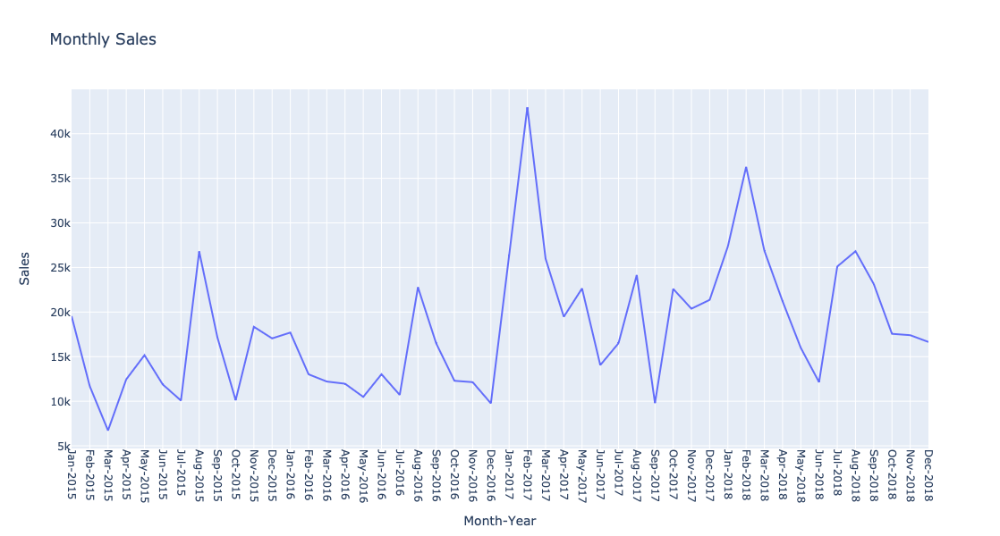

In [47]:
df_time['Month-Year'] = df_time['Order Date'].dt.strftime('%b-%Y')

monthly_sales = df_time.groupby('Month-Year').agg({'Sales': 'sum'}).reset_index()
monthly_sales['Order'] = pd.to_datetime(monthly_sales['Month-Year'], format='%b-%Y')
monthly_sales = monthly_sales.sort_values('Order')


fig = px.line(monthly_sales, x='Month-Year', y='Sales', title='Monthly Sales',
              labels={'Month-Year': 'Month-Year', 'Sales': 'Sales'})

fig.update_traces(hovertemplate='Date: %{x}<br>Sales: $%{y:,.2f}<extra></extra>')


fig.update_xaxes(tickangle=90, tickmode='array', tickvals=monthly_sales['Month-Year'],
                 ticktext=monthly_sales['Month-Year'])


fig.update_layout(width=900, height=600)


fig.show()

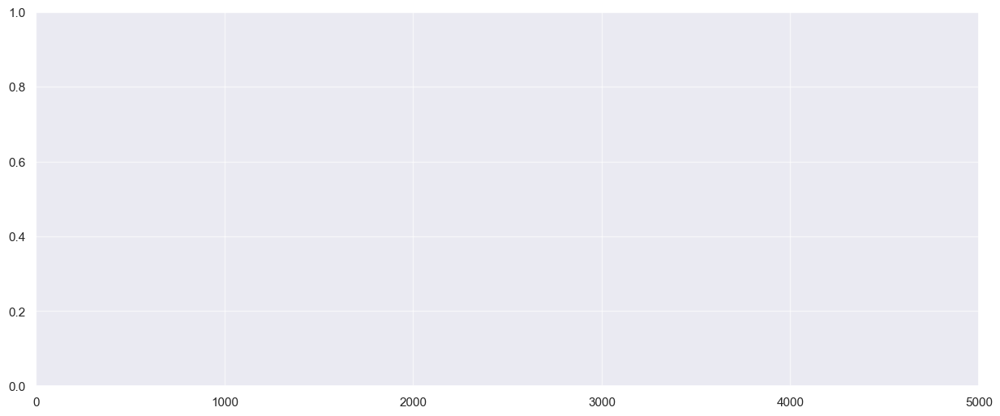

In [49]:
plt.figure(figsize = (15,6))
#plt.style.use('seaborn-colorblind')
plt.grid(True, alpha = 0.6)

sns.kdeplot(df.sort_values(by= ['Order Date'],  ascending=True).loc[(df['Order Date'] == '2015-03-24'), 'Sales'], label = '2015-March')
sns.kdeplot(df.sort_values(by= ['Order Date'],  ascending=True).loc[(df['Order Date'] == '2016-03-24'), 'Sales'], label = '2016-March')
sns.kdeplot(df.sort_values(by= ['Order Date'],  ascending=True).loc[(df['Order Date'] == '2017-03-24'), 'Sales'], label = '2017-March')

plt.xlim(left = 0, right = 5000)
plt.show()

In [50]:
df['Order Date'] = pd.to_datetime(df['Order Date'], format='%d/%m/%Y')
df_sorted = df.sort_values(by= ['Order Date'],  ascending=True)

df_sorted = df_sorted.set_index("Order Date")


df_time = pd.DataFrame(df_sorted['Sales'])

df_time =  pd.DataFrame(df_time['Sales'].resample('D').median())
df_time = df_time.interpolate(method='linear')

from statsmodels.tsa.stattools import adfuller
adf = adfuller(df_time) 

print(adf)
print('\nADF = ', str(adf[0])) 
print('\np-value = ', str(adf[1]))
print('\nCritical Values: ')

for key, val in adf[4].items(): #for loop to print the p-value (1%, 5% and 10%) and their respective values
    print(key,':',val)
    

    if adf[0] < val:
        print('Null Hypothesis Rejected. Time Series is Stationary')
    else:
        print('Null Hypothesis Accepted. Time Series is not Stationary')

(-9.136760473727142, 2.9215805771597433e-15, 4, 1435, {'1%': -3.4349151819757466, '5%': -2.863556216004778, '10%': -2.5678434198545568}, 17267.89857579318)

ADF =  -9.136760473727142

p-value =  2.9215805771597433e-15

Critical Values: 
1% : -3.4349151819757466
Null Hypothesis Rejected. Time Series is Stationary
5% : -2.863556216004778
Null Hypothesis Rejected. Time Series is Stationary
10% : -2.5678434198545568
Null Hypothesis Rejected. Time Series is Stationary


In [51]:
def is_stationary(y):

    # "HO: Non-stationary"
    # "H1: Stationary"

    p_value = sm.tsa.stattools.adfuller(y)[1]
    if p_value < 0.05:
        print(F"Result: Stationary (H0: non-stationary, p-value: \
          {round(p_value, 3)})")
    else:
        print(F"Result: Non-Stationary (H0: non-stationary, p-value: \
          {round(p_value, 3)})")

def ts_decompose(y, model="additive", stationary=False):
    result = sm.tsa.seasonal_decompose(y, model=model)
    fig, axes = plt.subplots(4, 1, sharex=True, sharey=False)
    fig.set_figheight(8)
    fig.set_figwidth(10)

    axes[0].set_title("Decomposition for " + model + " model")
    axes[0].plot(y, 'k', label='Original ' + model)
    axes[0].legend(loc='upper left')

    axes[1].plot(result.trend, label='Trend')
    axes[1].legend(loc='upper left')

    axes[2].plot(result.seasonal, 'g', label='Seasonality & Mean: ' + str(round(result.seasonal.mean(), 4)))
    axes[2].legend(loc='upper left')

    axes[3].plot(result.resid, 'r', label='Residuals & Mean: ' + str(round(result.resid.mean(), 4)))
    axes[3].legend(loc='upper left')
    plt.show(block=True)

    if stationary:
        is_stationary(y)

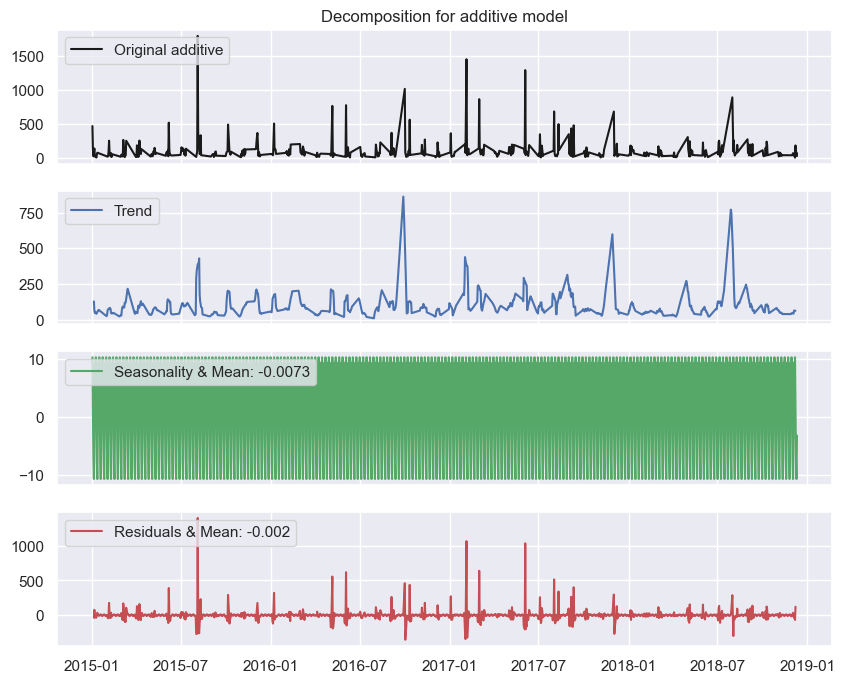

Result: Stationary (H0: non-stationary, p-value:           0.0)


In [52]:
ts_decompose(df_time, stationary=True)